# Building the network

In [10]:
 %config Completer.use_jedi = False 
import networkx as nx
import community as c
import pandas as pd
import matplotlib.pyplot as plt    
import os as os
import numpy as np
import random
random.seed(246)
    

In [11]:
os.getcwd()

'/home/max/Documents/MStatistics/MDAFinal/mda2/FIltered Files-20210526T193921Z-001/FIltered Files'

In [12]:
df2019q3 = pd.read_csv("2019Q3_Filtered.csv")
df2019q4 = pd.read_csv("2019Q4_Filtered.csv")
df2020q1 = pd.read_csv("2020Q1_Filtered.csv")
df2020q2 = pd.read_csv("2020Q2_Filtered.csv")
df2020q3 = pd.read_csv("2020Q3_Filtered.csv")
df2021q1 = pd.read_csv("2021Q1_Filtered.csv")

In [13]:
df2019q3

,Unnamed: 0,name,cik,state,issuers,cussip,shares,shares_type
0,5263,Neumann Advisory Hong Kong Ltd,1727862,K3,Sinovac,P8696W104,315586.0,SH
1,25953,RIVERBRIDGE PARTNERS LLC,1112325,MN,Roche,767744105,4076884.0,SH
2,26154,"SCOUT INVESTMENTS, INC.",1161927,MO,Novartis,654802206,106731.0,SH
3,26190,"SCOUT INVESTMENTS, INC.",1161927,MO,Roche,770323103,194208.0,SH
4,149471,First American Bank,1291422,IL,Glaxosmithkline,375558103,69833.0,SH
...,...,...,...,...,...,...,...,...
980,1850436,PRICE T ROWE ASSOCIATES INC /MD/,80255,MD,Novartis,65158N102,65203.0,SH
981,1869015,CALIFORNIA PUBLIC EMPLOYEES RETIREMENT SYSTEM,919079,CA,Merck,58471A105,69183.0,SH
982,1869343,CALIFORNIA PUBLIC EMPLOYEES RETIREMENT SYSTEM,919079,CA,Roche,695263103,276274.0,SH
983,1869399,CALIFORNIA PUBLIC EMPLOYEES RETIREMENT SYSTEM,919079,CA,Pfizer,712706209,8372.0,SH


In [14]:
investors=pd.read_csv('investors.csv')
print(investors)

                             investor
0   BERKSHIRE ASSET MANAGEMENT LLC/PA
1                      BlackRock Inc.
2                   CREDIT SUISSE AG/
3                 DRW Securities, LLC
4                             FMR LLC
..                                ...
60                 Redmile Group, LLC
61     Neumann Advisory Hong Kong Ltd
62               ORBIMED ADVISORS LLC
63    Spark Investment Management LLC
64                  Vivo Capital, LLC

[65 rows x 1 columns]


Check if only investors in the investor data.frame are present 

In [15]:
df2019q3[df2019q3.name.isin(investors["investor"])]

,Unnamed: 0,name,cik,state,issuers,cussip,shares,shares_type
0,5263,Neumann Advisory Hong Kong Ltd,1727862,K3,Sinovac,P8696W104,315586.0,SH
1,25953,RIVERBRIDGE PARTNERS LLC,1112325,MN,Roche,767744105,4076884.0,SH
2,26154,"SCOUT INVESTMENTS, INC.",1161927,MO,Novartis,654802206,106731.0,SH
3,26190,"SCOUT INVESTMENTS, INC.",1161927,MO,Roche,770323103,194208.0,SH
4,149471,First American Bank,1291422,IL,Glaxosmithkline,375558103,69833.0,SH
...,...,...,...,...,...,...,...,...
980,1850436,PRICE T ROWE ASSOCIATES INC /MD/,80255,MD,Novartis,65158N102,65203.0,SH
981,1869015,CALIFORNIA PUBLIC EMPLOYEES RETIREMENT SYSTEM,919079,CA,Merck,58471A105,69183.0,SH
982,1869343,CALIFORNIA PUBLIC EMPLOYEES RETIREMENT SYSTEM,919079,CA,Roche,695263103,276274.0,SH
983,1869399,CALIFORNIA PUBLIC EMPLOYEES RETIREMENT SYSTEM,919079,CA,Pfizer,712706209,8372.0,SH


Create a network

In [16]:
G=nx.Graph()
G.add_nodes_from(df2019q3["name"])


In [17]:
r = np.random.RandomState(seed=5)
ints = r.random_integers(1, 10, size=(3,2))
a = ['A', 'B', 'C']
b = ['D', 'A', 'E']
df = pd.DataFrame(ints, columns=['weight', 'cost'])
df[0] = a
df['b'] = b
df


/home/max/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: This function is deprecated. Please call randint(1, 10 + 1) instead
  


,weight,cost,0,b
0,4,7,A,D
1,7,1,B,A
2,10,9,C,E


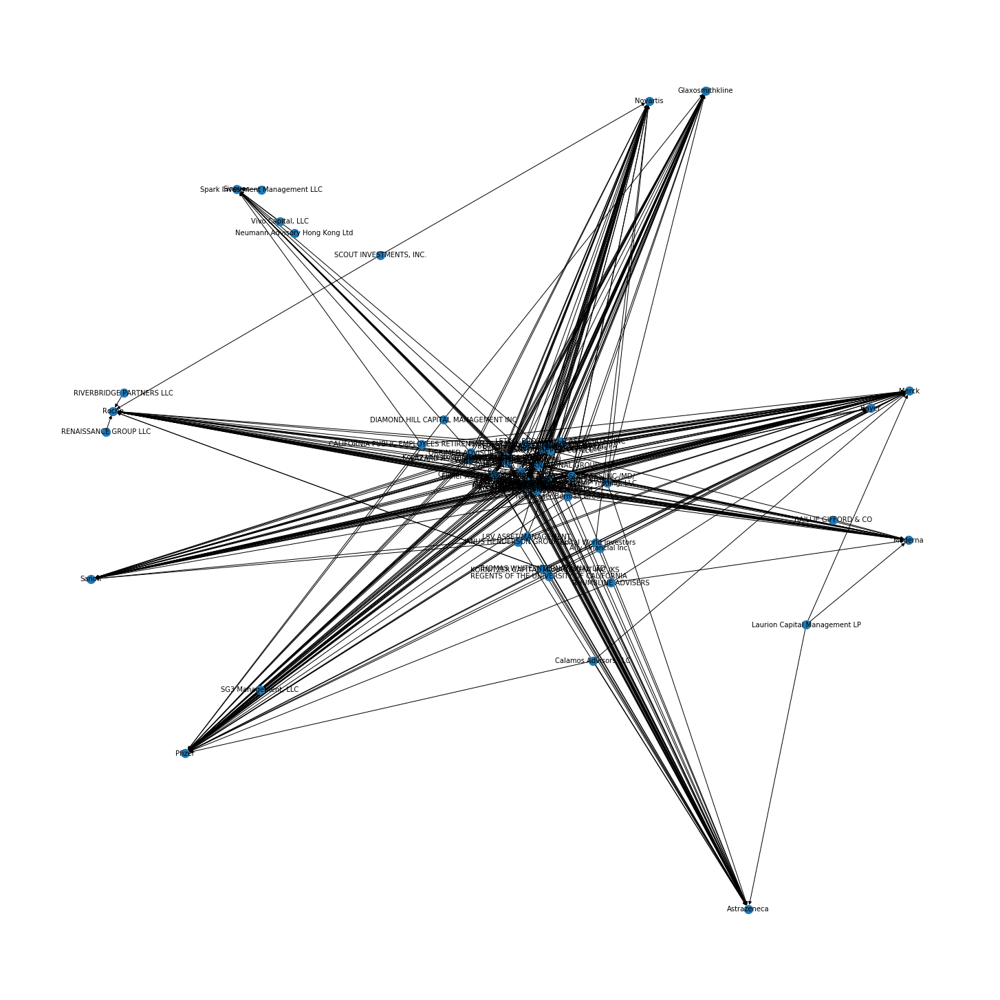

In [20]:
edgelist = df2019q3[["name","issuers","shares"]]
G=nx.DiGraph()
G=nx.from_pandas_edgelist(edgelist, 'name', 'issuers', ['shares'],create_using=nx.DiGraph(),)

plt.figure(3,figsize=(20,20)) 
nx.draw(G,with_labels=True,node_size=150,font_size=10)
plt.show()



Other geometries

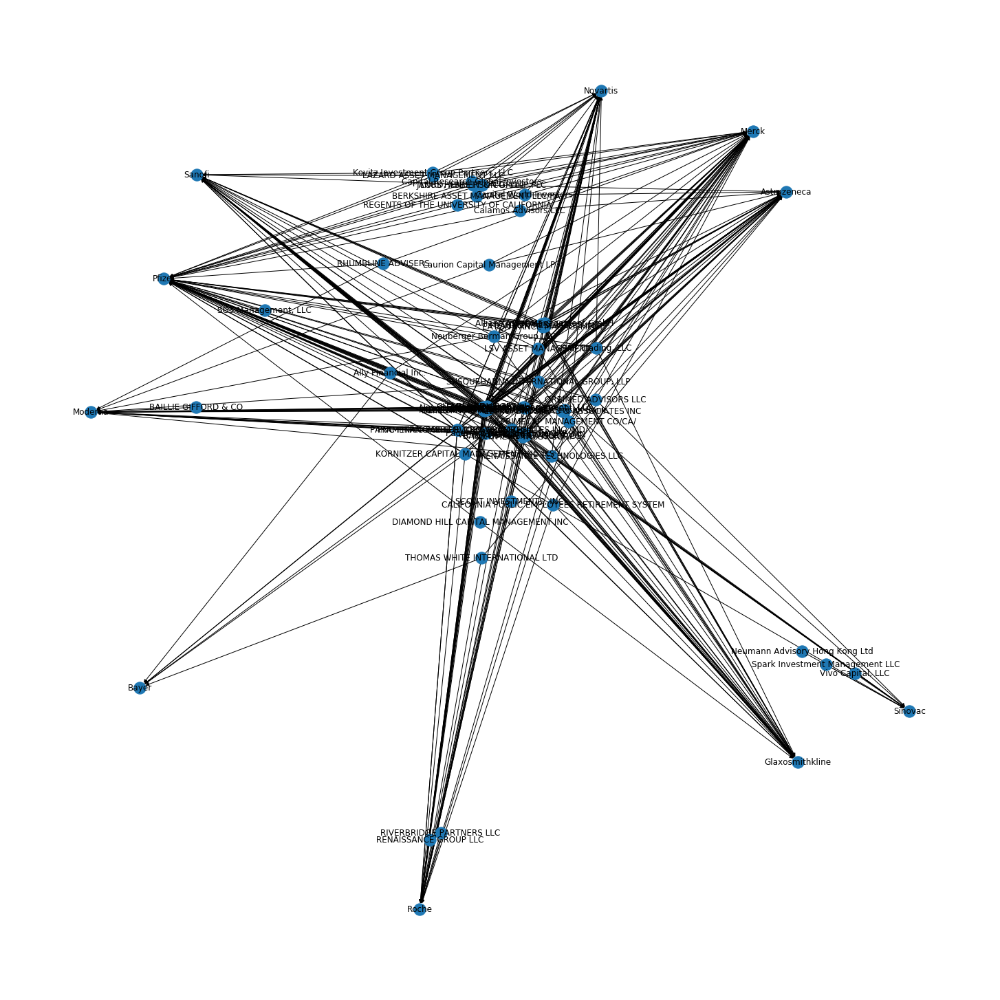

In [21]:
plt.figure(3,figsize=(20,20)) 
nx.draw(G,with_labels=True)  


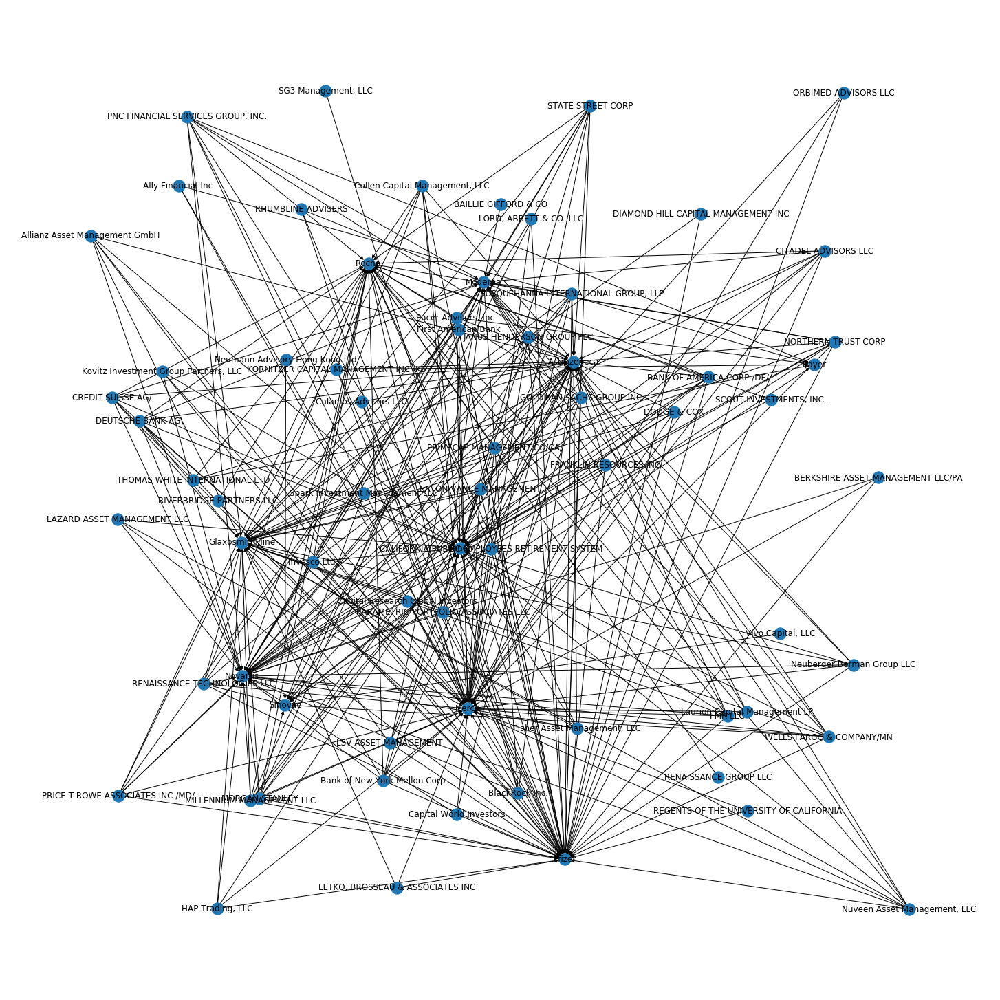

In [22]:
plt.figure(3,figsize=(20,20)) 
nx.draw_random(G,with_labels=True)  


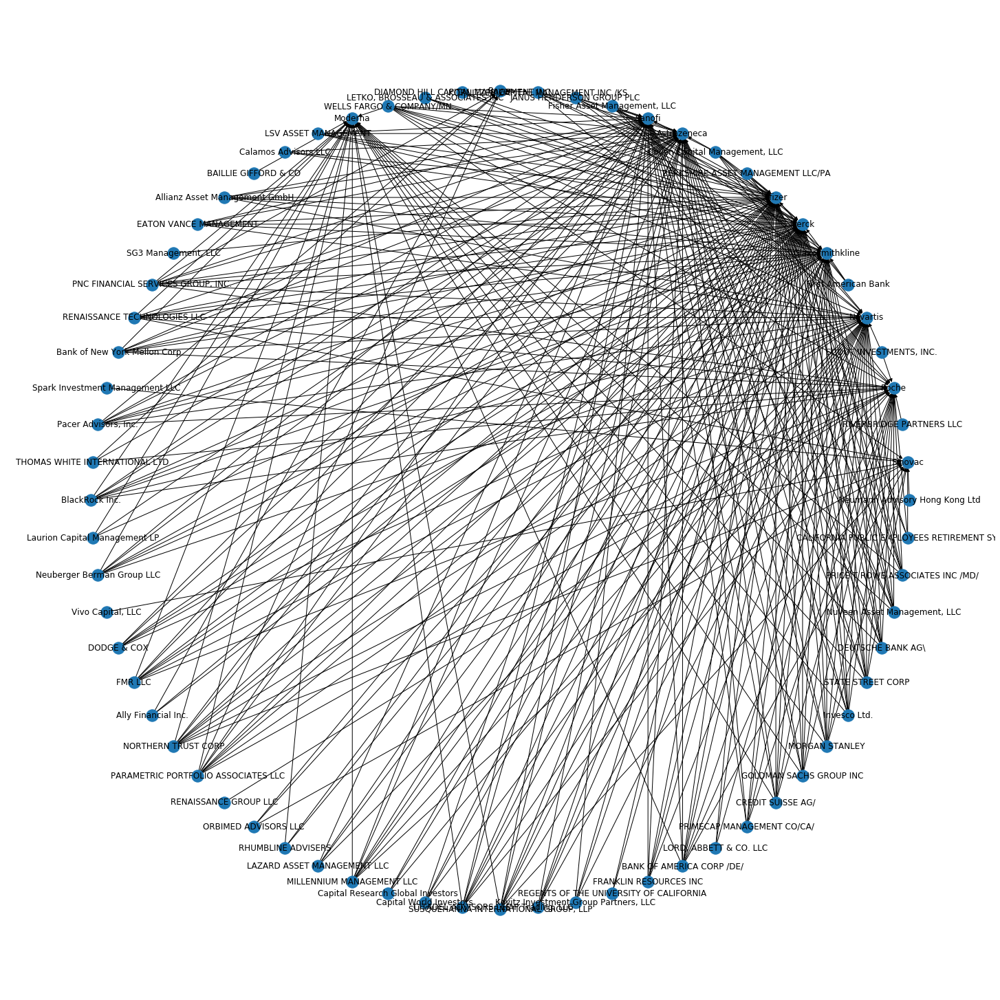

In [23]:
plt.figure(3,figsize=(20,20)) 
nx.draw_circular(G,with_labels=True)  


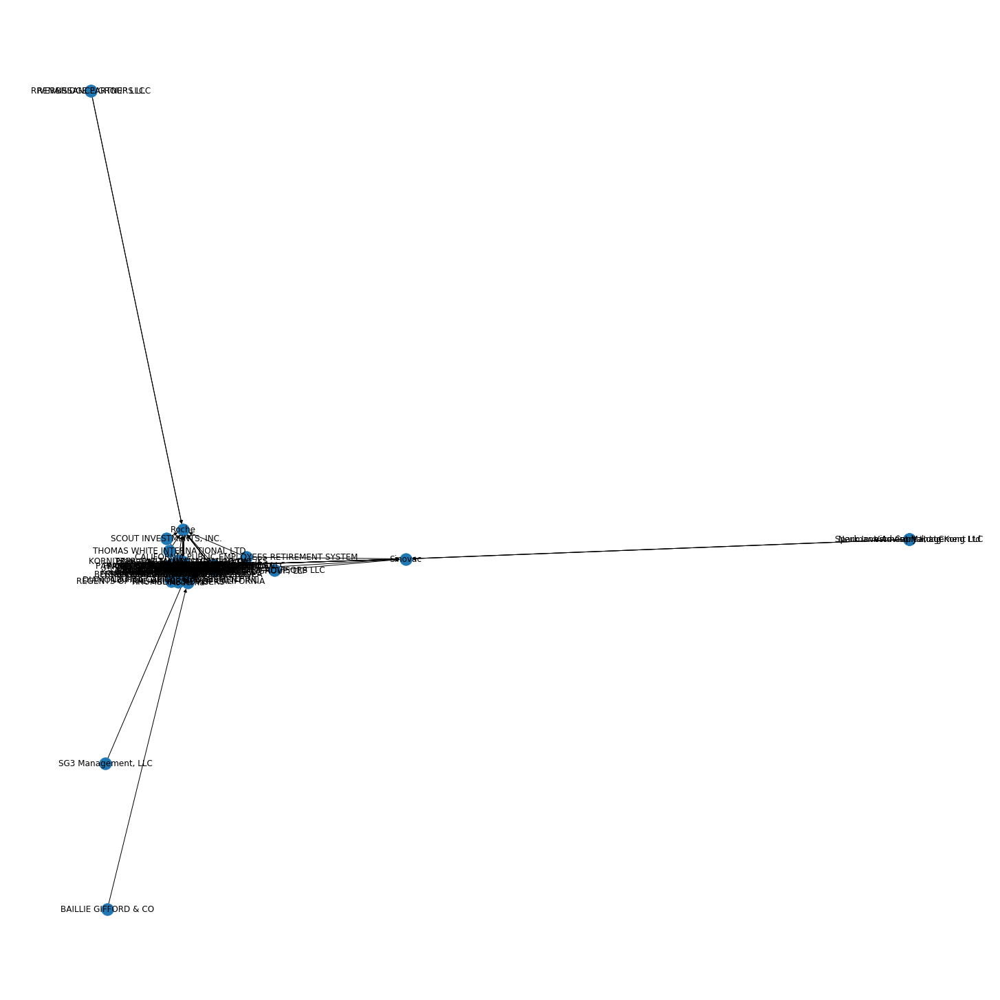

In [24]:
plt.figure(3,figsize=(20,20)) 
nx.draw_spectral(G,with_labels=True)  


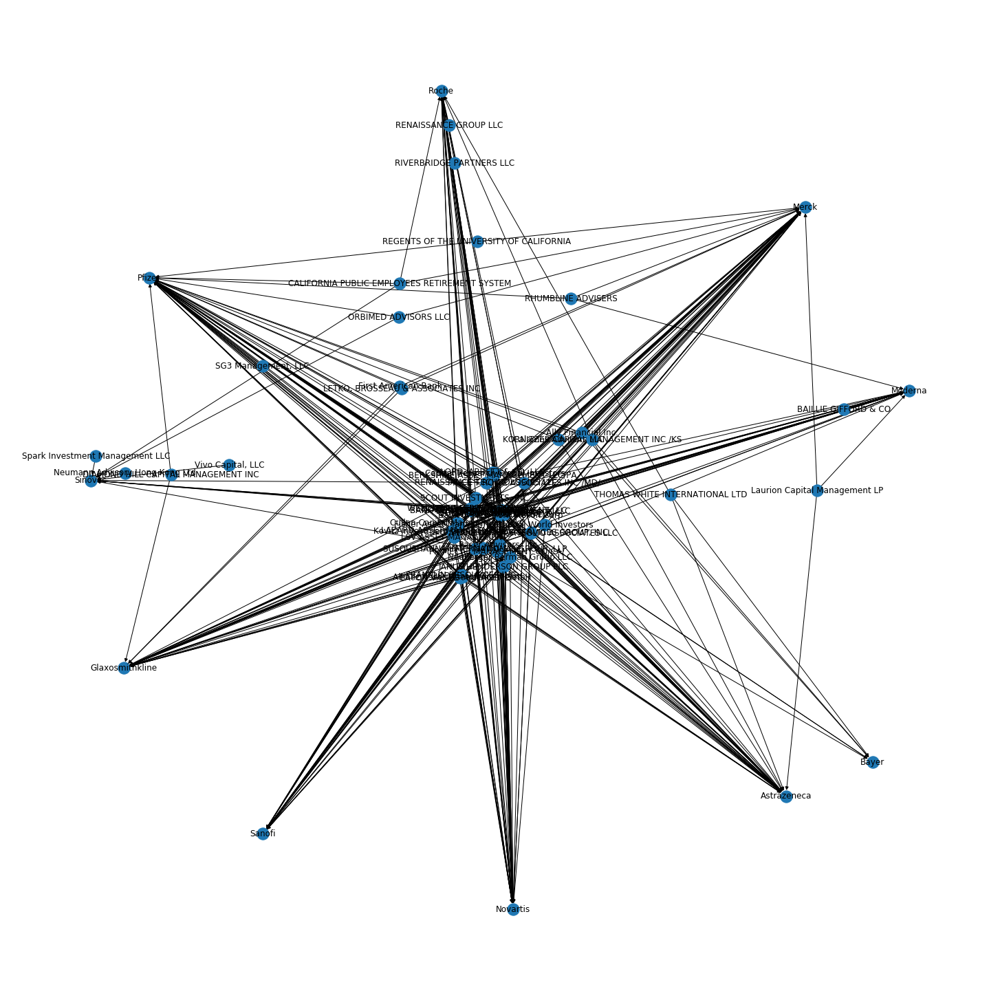

In [25]:
plt.figure(3,figsize=(20,20)) 
nx.draw_spring(G,with_labels=True)  


## The network is complex and readability could be improved by reducing the number of funds (sources) and by coloring sources and target nodes in a different color. 

### color the network

In [26]:
edgelist = df2019q3[["name","issuers","shares"]]
G=nx.DiGraph()
G=nx.from_pandas_edgelist(edgelist, 'name', 'issuers', ['shares'],create_using=nx.DiGraph(),)




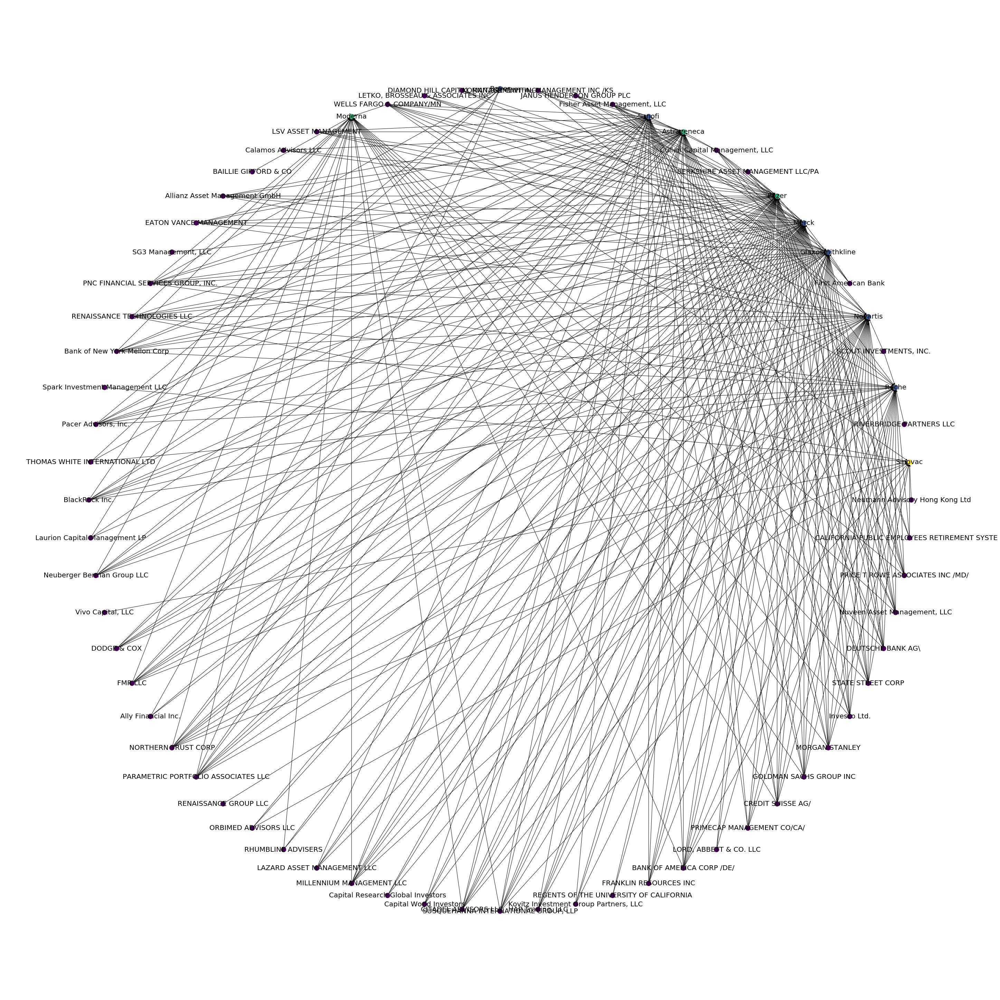

In [27]:
val_map = {'Pfizer':2.0,
           'Astrazeneca': 2.0,
           'Moderna': 2.0,
           'Sinovac': 3.0,
           'Curevac': 1.0,
           'Merck': 1.0,
           'Themis': 1.0,
           'Glaxosmithkline': 1.0,
           'Novartis': 1.0,
           'Roche': 1.0,
           'Sanofi': 1.0,
           'Bayer':1.0          
          }
values = [val_map.get(node, 0.25) for node in G.nodes()]

plt.figure(3,figsize=(40,40)) 
nx.draw_circular(G, cmap=plt.get_cmap('viridis'), node_color=values, with_labels=True,node_size=200,font_size=20)
plt.show()



In [28]:
df2019q3

,Unnamed: 0,name,cik,state,issuers,cussip,shares,shares_type
0,5263,Neumann Advisory Hong Kong Ltd,1727862,K3,Sinovac,P8696W104,315586.0,SH
1,25953,RIVERBRIDGE PARTNERS LLC,1112325,MN,Roche,767744105,4076884.0,SH
2,26154,"SCOUT INVESTMENTS, INC.",1161927,MO,Novartis,654802206,106731.0,SH
3,26190,"SCOUT INVESTMENTS, INC.",1161927,MO,Roche,770323103,194208.0,SH
4,149471,First American Bank,1291422,IL,Glaxosmithkline,375558103,69833.0,SH
...,...,...,...,...,...,...,...,...
980,1850436,PRICE T ROWE ASSOCIATES INC /MD/,80255,MD,Novartis,65158N102,65203.0,SH
981,1869015,CALIFORNIA PUBLIC EMPLOYEES RETIREMENT SYSTEM,919079,CA,Merck,58471A105,69183.0,SH
982,1869343,CALIFORNIA PUBLIC EMPLOYEES RETIREMENT SYSTEM,919079,CA,Roche,695263103,276274.0,SH
983,1869399,CALIFORNIA PUBLIC EMPLOYEES RETIREMENT SYSTEM,919079,CA,Pfizer,712706209,8372.0,SH


#### Only select investment funds owning more than 1% in the pharmaceutical companies

Group the dataset by the pharmaceutical company

In [29]:
c=df2019q3.groupby(['issuers','name'])['shares'].sum().rename('count')
c

issuers      name                                
Astrazeneca  Allianz Asset Management GmbH             248293.0
             BANK OF AMERICA CORP /DE/                 533614.0
             Bank of New York Mellon Corp              213495.0
             BlackRock Inc.                           2551864.0
             CITADEL ADVISORS LLC                      377949.0
                                                        ...    
Sinovac      STATE STREET CORP                       11750000.0
             SUSQUEHANNA INTERNATIONAL GROUP, LLP        7200.0
             Spark Investment Management LLC           174200.0
             Vivo Capital, LLC                        4011236.0
             WELLS FARGO & COMPANY/MN                  111528.0
Name: count, Length: 307, dtype: float64

Create the proportion column

In [30]:
p=c/c.groupby(level=0).sum()
p.df = p.reset_index()


Select rows with count above 1% 

In [31]:
onepercent = p.df[p.df["count"]>.01]


Transform onepercent panda to a list and initiate the network

In [32]:
onep_list = onepercent[["name","issuers","count"]]
G=nx.DiGraph()
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph(),)


Now we can build the digraph with the following characteristics :
    * Source vertices : Investment funds
    * Target vertices : Pharmaceutical Companies
    * Width of the edges : Proportional to the percentage of the shares owned by Investment Fund A in Pharmaceutical Company B. If there are 100 shares of pharmaceutical B and investment fund has 33 of them, the width of the edge connecting A and B will be proportional to 1/3. 
    * Size of the vertices : proportional to the betweenness centrality of the nodes (i.e the betweenness centrality of a given node is defined as the number of the shortest paths between two random nodes).  

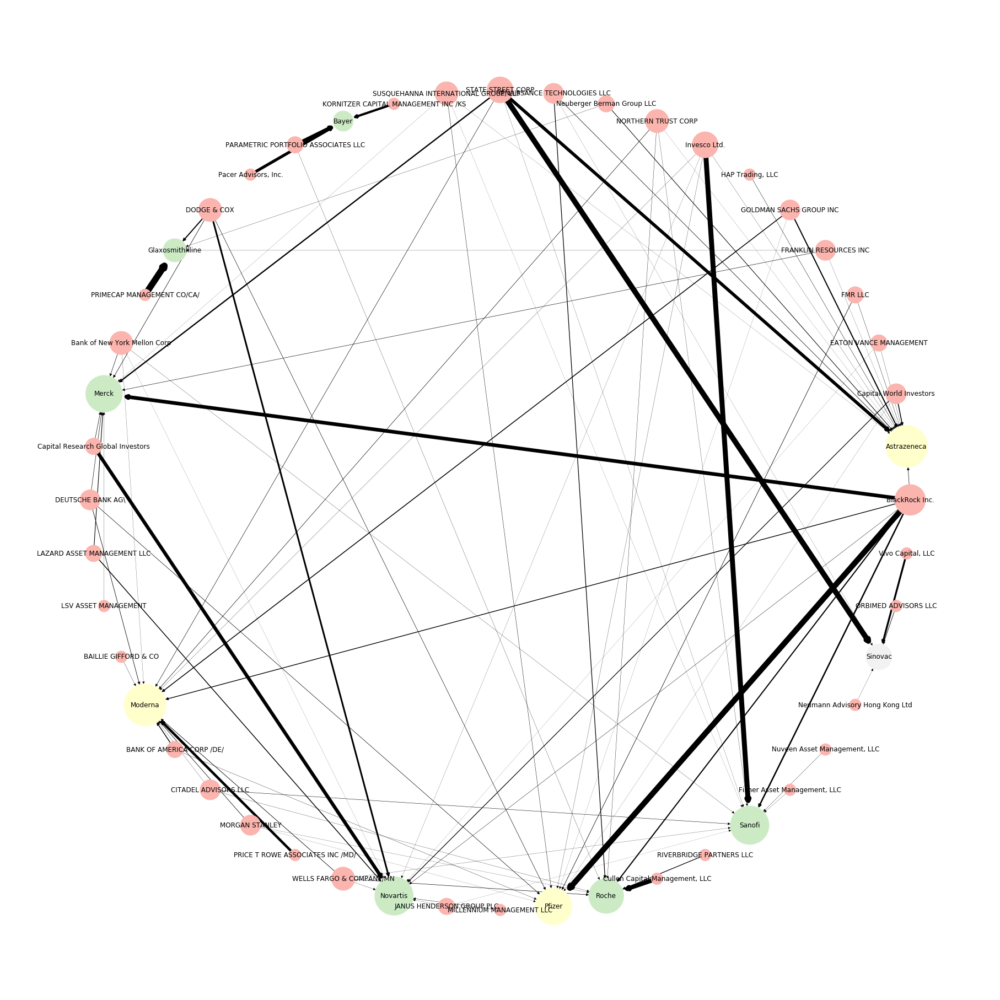

In [33]:
G=nx.DiGraph(seed=15)
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph())
betCent = nx.betweenness_centrality(G, normalized=True, endpoints=True)
node_size =  [v * 1000000 for v in betCent.values()]
weights = nx.get_edge_attributes(G,'count').values()
weights2 =list(weights)
weights2 = [i * 15 for i in weights2]
nx.betweenness_centrality
val_map = {'Pfizer':2.0,
           'Astrazeneca': 2.0,
           'Moderna': 2.0,
           'Sinovac': 3.0,
           'Curevac': 1.0,
           'Merck': 1.0,
           'Themis': 1.0,
           'Glaxosmithkline': 1.0,
           'Novartis': 1.0,
           'Roche': 1.0,
           'Sanofi': 1.0,
           'Bayer':1.0          
          }

values = [val_map.get(node, 0.25) for node in G.nodes()]

plt.figure(3,figsize=(25,25)) 
nx.draw_circular(G,cmap=plt.get_cmap('Pastel1'),node_color=values,width=weights2,with_labels=True,node_size=node_size,font_size=12,)
plt.show()




### Replicating for other quartely periods

#### 2019 Q4

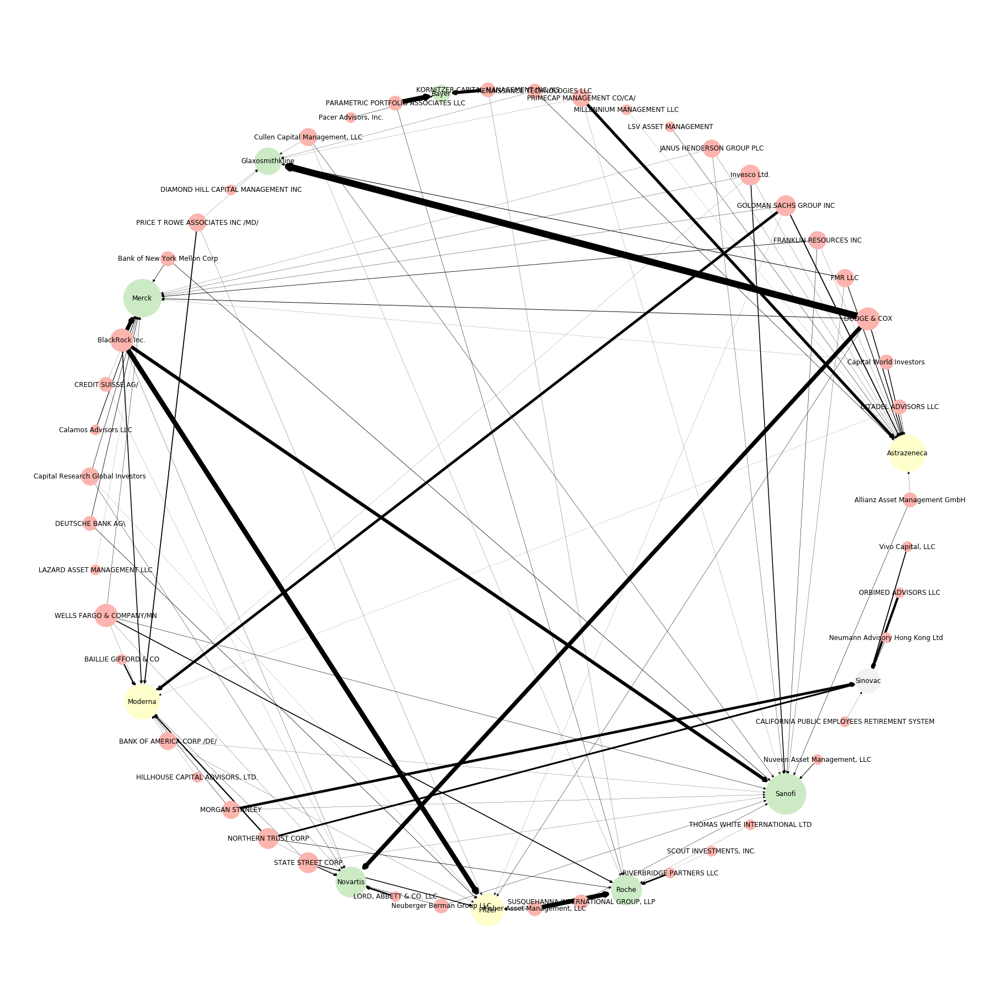

In [34]:
c=df2019q4.groupby(['issuers','name'])['shares'].sum().rename('count')
p=c/c.groupby(level=0).sum()
p.df = p.reset_index()
onepercent = p.df[p.df["count"]>.01]
onep_list = onepercent[["name","issuers","count"]]
G=nx.DiGraph()
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph(),)
G=nx.DiGraph(seed=15)
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph())
betCent = nx.betweenness_centrality(G, normalized=True, endpoints=True)
node_size =  [v * 1000000 for v in betCent.values()]
weights = nx.get_edge_attributes(G,'count').values()
weights2 =list(weights)
weights2 = [i * 15 for i in weights2]

val_map = {'Pfizer':2.0,
           'Astrazeneca': 2.0,
           'Moderna': 2.0,
           'Sinovac': 3.0,
           'Curevac': 1.0,
           'Merck': 1.0,
           'Themis': 1.0,
           'Glaxosmithkline': 1.0,
           'Novartis': 1.0,
           'Roche': 1.0,
           'Sanofi': 1.0,
           'Bayer':1.0          
          }

values = [val_map.get(node, 0.25) for node in G.nodes()]

plt.figure(3,figsize=(25,25)) 
nx.draw_circular(G,cmap=plt.get_cmap('Pastel1'),node_color=values,width=weights2,with_labels=True,node_size=node_size,font_size=12,)
plt.show()


# 2020 Q1

In [ ]:
c=df2020q1.groupby(['issuers','name'])['shares'].sum().rename('count')
p=c/c.groupby(level=0).sum()
p.df = p.reset_index()
onepercent = p.df[p.df["count"]>.01]
onep_list = onepercent[["name","issuers","count"]]
G=nx.DiGraph()
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph(),)
G=nx.DiGraph(seed=15)
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph())
betCent = nx.betweenness_centrality(G, normalized=True, endpoints=True)

node_size =  [v * 1000000 for v in betCent.values()]
weights = nx.get_edge_attributes(G,'count').values()
weights2 =list(weights)
weights2 = [i * 15 for i in weights2]

val_map = {'Pfizer':2.0,
           'Astrazeneca': 2.0,
           'Moderna': 2.0,
           'Sinovac': 3.0,
           'Curevac': 1.0,
           'Merck': 1.0,
           'Themis': 1.0,
           'Glaxosmithkline': 1.0,
           'Novartis': 1.0,
           'Roche': 1.0,
           'Sanofi': 1.0,
           'Bayer':1.0          
          }

values = [val_map.get(node, 0.25) for node in G.nodes()]

plt.figure(3,figsize=(25,25)) 
nx.draw_circular(G,cmap=plt.get_cmap('Pastel1'),node_color=values,width=weights2,with_labels=True,node_size=node_size,font_size=12,)
plt.show()

#### 2020 Q2

In [ ]:
c=df2020q2.groupby(['issuers','name'])['shares'].sum().rename('count')
p=c/c.groupby(level=0).sum()
p.df = p.reset_index()
onepercent = p.df[p.df["count"]>.01]
onep_list = onepercent[["name","issuers","count"]]
G=nx.DiGraph()
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph(),)
G=nx.DiGraph(seed=15)
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph())
betCent = nx.betweenness_centrality(G, normalized=True, endpoints=True)
node_size =  [v * 1000000 for v in betCent.values()]
weights = nx.get_edge_attributes(G,'count').values()
weights2 =list(weights)
weights2 = [i * 15 for i in weights2]

val_map = {'Pfizer':2.0,
           'Astrazeneca': 2.0,
           'Moderna': 2.0,
           'Sinovac': 3.0,
           'Curevac': 1.0,
           'Merck': 1.0,
           'Themis': 1.0,
           'Glaxosmithkline': 1.0,
           'Novartis': 1.0,
           'Roche': 1.0,
           'Sanofi': 1.0,
           'Bayer':1.0          
          }

values = [val_map.get(node, 0.25) for node in G.nodes()]

plt.figure(3,figsize=(25,25)) 
nx.draw_circular(G,cmap=plt.get_cmap('Pastel1'),node_color=values,width=weights2,with_labels=True,node_size=node_size,font_size=12,)
plt.show()

#### 2020 Q3

In [ ]:
c=df2020q3.groupby(['issuers','name'])['shares'].sum().rename('count')
p=c/c.groupby(level=0).sum()
p.df = p.reset_index()
onepercent = p.df[p.df["count"]>.01]
onep_list = onepercent[["name","issuers","count"]]
G=nx.DiGraph()
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph(),)
G=nx.DiGraph(seed=15)
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph())
betCent = nx.betweenness_centrality(G, normalized=True, endpoints=True)
node_size =  [v * 1000000 for v in betCent.values()]
weights = nx.get_edge_attributes(G,'count').values()
weights2 =list(weights)
weights2 = [i * 15 for i in weights2]

val_map = {'Pfizer':2.0,
           'Astrazeneca': 2.0,
           'Moderna': 2.0,
           'Sinovac': 3.0,
           'Curevac': 1.0,
           'Merck': 1.0,
           'Themis': 1.0,
           'Glaxosmithkline': 1.0,
           'Novartis': 1.0,
           'Roche': 1.0,
           'Sanofi': 1.0,
           'Bayer':1.0          
          }

values = [val_map.get(node, 0.25) for node in G.nodes()]

plt.figure(3,figsize=(25,25)) 
nx.draw_circular(G,cmap=plt.get_cmap('Pastel1'),node_color=values,width=weights2,with_labels=True,node_size=node_size,font_size=12,)
plt.show()

#### 2020 Q4 missing

#### 2021 Q1 

In [ ]:
c=df2021q1.groupby(['issuers','name'])['shares'].sum().rename('count')
p=c/c.groupby(level=0).sum()
p.df = p.reset_index()
onepercent = p.df[p.df["count"]>.01]
onep_list = onepercent[["name","issuers","count"]]
G=nx.DiGraph()
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph(),)
G=nx.DiGraph(seed=15)
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph())
betCent = nx.betweenness_centrality(G, normalized=True, endpoints=True)
node_size =  [v * 1000000 for v in betCent.values()]
weights = nx.get_edge_attributes(G,'count').values()
weights2 =list(weights)
weights2 = [i * 15 for i in weights2]

val_map = {'Pfizer':2.0,
           'Astrazeneca': 2.0,
           'Moderna': 2.0,
           'Sinovac': 3.0,
           'Curevac': 1.0,
           'Merck': 1.0,
           'Themis': 1.0,
           'Glaxosmithkline': 1.0,
           'Novartis': 1.0,
           'Roche': 1.0,
           'Sanofi': 1.0,
           'Bayer':1.0          
          }

values = [val_map.get(node, 0.25) for node in G.nodes()]

plt.figure(3,figsize=(25,25)) 
nx.draw_circular(G,cmap=plt.get_cmap('Pastel1'),node_color=values,width=weights2,with_labels=True,node_size=node_size,font_size=12,)
plt.show()

Using other centrality measures

In [ ]:
c=df2021q1.groupby(['issuers','name'])['shares'].sum().rename('count')
p=c/c.groupby(level=0).sum()
p.df = p.reset_index()
onepercent = p.df[p.df["count"]>.01]
onep_list = onepercent[["name","issuers","count"]]
G=nx.DiGraph()
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph(),)
G=nx.DiGraph(seed=15)
G=nx.from_pandas_edgelist(onep_list, 'name', 'issuers', ['count'],create_using=nx.DiGraph())
eigCent = nx.eigenvector_centrality(G,max_iter=10000,weight='count')
node_size =  [v * 10000 for v in eigCent.values()]

In [ ]:

weights = nx.get_edge_attributes(G,'count').values()
weights2 =list(weights)
weights2 = [i * 15 for i in weights2]

val_map = {'Pfizer':2.0,
           'Astrazeneca': 2.0,
           'Moderna': 2.0,
           'Sinovac': 3.0,
           'Curevac': 1.0,
           'Merck': 1.0,
           'Themis': 1.0,
           'Glaxosmithkline': 1.0,
           'Novartis': 1.0,
           'Roche': 1.0,
           'Sanofi': 1.0,
           'Bayer':1.0          
          }

values = [val_map.get(node, 0.25) for node in G.nodes()]

plt.figure(3,figsize=(25,25)) 
nx.draw_circular(G,cmap=plt.get_cmap('Pastel1'),node_color=values,width=weights2,with_labels=True,node_size=node_size,font_size=12,)
plt.show()